# Example: Neural Networks

Before runnning this notebook, make sure that all neccesary libraries are installed:

In [90]:
using Flux
using Random
using Gogeta
using Plots
using Gurobi
using JuMP

Suppose, you have a dataset and you trained a neural network on it. Now, you have a neural network with some weights that model some function. In our case for example purposes this model is innitialized with random weights:

## Innitialize neural network with random weights

In [91]:
# Create a small neural network with random weights
begin
    Random.seed!(1234);

    NN_model = Chain(
        Dense(2 => 10, relu),
        Dense(10 => 50, relu),
        Dense(50 => 20, relu),
        Dense(20 => 5, relu),
        Dense(5 => 1)
    )
end

Chain(
  Dense(2 => 10, relu),                 # 30 parameters
  Dense(10 => 50, relu),                # 550 parameters
  Dense(50 => 20, relu),                # 1_020 parameters
  Dense(20 => 5, relu),                 # 105 parameters
  Dense(5 => 1),                        # 6 parameters
)                   # Total: 10 arrays, 1_711 parameters, 7.309 KiB.

The input of the neural network is a 2d vector. `init_U` stores uppper and `init_L` lower bounds for variables. 

In [92]:
init_U = [-0.5, 0.5];
init_L = [-1.5, -0.5];

Innitialize empty jump model with `Gurobi`

In [93]:
# Formulate the MIP with optimization-based bound tightening
jump_model = Model(Gurobi.Optimizer);
set_silent(jump_model)
set_attribute(jump_model, "TimeLimit", 10)

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20


## Optimization-based bound tightening approach

There are multiple ways how to formulate NN as MIP problem. The first one is to use optimization-based bound tightening approach. For this approach, you should just set `bound_tightening="standard"`

In [94]:
@time bounds_U, bounds_L = NN_formulate!(jump_model, NN_model, init_U, init_L; bound_tightening="standard", silent=true);

jump_model

  1.895629 seconds (137.90 k allocations: 6.368 MiB)


A JuMP Model
Maximization problem with:
Variables: 258
Objective function type: AffExpr
`AffExpr`-in-`MathOptInterface.EqualTo{Float64}`: 86 constraints
`AffExpr`-in-`MathOptInterface.GreaterThan{Float64}`: 172 constraints
`AffExpr`-in-`MathOptInterface.LessThan{Float64}`: 172 constraints
`VariableRef`-in-`MathOptInterface.ZeroOne`: 85 constraints
Model mode: AUTOMATIC
CachingOptimizer state: ATTACHED_OPTIMIZER
Solver name: Gurobi
Names registered in the model: s, x, z

***Note:*** by default, the objective function of the model is set to dummy function `max(1)`. User can change the objective function according to his/her preferences.  By setting

`@objective(jump_model, Min, objective_function)`

after `NN_formulate!`


To get forward pass of the input data, we call `forward_pass!(input)`

In [95]:
sample_input = [-0.75, 0]
println("Input data: ", sample_input, "\nForward pass output: ", forward_pass!(jump_model, sample_input))

Input data: [-0.75, 0.0]
Forward pass output: [-0.19059307321001445]


In [96]:
x_range = LinRange{Float32}(init_L[1], init_U[1], 100);
y_range = LinRange{Float32}(init_L[2], init_U[2], 100);

We define `x_range` and `y_range` as values in the range defined by upper and lower bounds and calculate the outpput of the forward pass with NN and with our MIP formulation. If the formulation is correct, then the output plot should be the same.

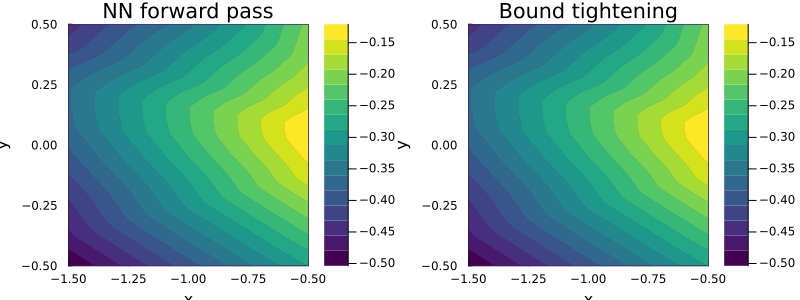

In [97]:
c_1 = contourf(x_range, y_range, xlabel="x", ylabel="y", title="NN forward pass", (x, y) -> NN_model(hcat(x, y)')[], c=cgrad(:viridis), lw=0)
c_2 = contourf(x_range, y_range, xlabel="x", ylabel="y", title="Bound tightening", (x, y) -> forward_pass!(jump_model, [x, y])[], c=cgrad(:viridis), lw=0)
plot(c_1, c_2, layout=(1, 2), size=(800, 300))

## Optimization-based bound tightening and compression

Set `bound_tightening="standard"` and `compress=true`

In [98]:
jump_model = Model(Gurobi.Optimizer);
set_silent(jump_model)
set_attribute(jump_model, "TimeLimit", 10)
@time NN_comp, removed, comp_U, comp_L = NN_formulate!(jump_model, NN_model, init_U, init_L; bound_tightening="standard", compress=true, silent=true);

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20
  1.289584 seconds (127.87 k allocations: 5.486 MiB)


Then `NN_formulate!()` function would also return `NN_comp` (smaller neural network) and `removed` (removed neurons)

In [99]:
NN_comp

Chain(
  Dense(2 => 8, relu),                  # 24 parameters
  Dense(8 => 33, relu),                 # 297 parameters
  Dense(33 => 10, relu),                # 340 parameters
  Dense(10 => 1),                       # 11 parameters
)                   # Total: 8 arrays, 672 parameters, 3.125 KiB.

In [100]:
NN_model

Chain(
  Dense(2 => 10, relu),                 # 30 parameters
  Dense(10 => 50, relu),                # 550 parameters
  Dense(50 => 20, relu),                # 1_020 parameters
  Dense(20 => 5, relu),                 # 105 parameters
  Dense(5 => 1),                        # 6 parameters
)                   # Total: 10 arrays, 1_711 parameters, 7.309 KiB.

If you compare `NN_comp` and `NN_model`, you will notice that `NN_comp` has less parameters

In [101]:
removed

5-element Vector{Vector}:
 [6, 8]
 [6, 7, 16, 17, 21, 23, 25, 27, 28, 32, 39, 41, 42, 43, 44, 45, 48]
 [1, 2, 6, 8, 9, 12, 13, 15, 19, 20]
 [1, 2, 3, 4, 5]
 Int64[]

But though `NN_comp` is smaller, the output is still the same as with original `NN_model`

In [102]:
sample_input = [-0.75, 0]
println("Input data: ", sample_input, "\nCompressed NN output: ", NN_comp(sample_input))

Input data: [-0.75, 0.0]
Compressed NN output: Float32[-0.19059314]


In [103]:
println("Input data: ", sample_input, "\nForward pass output: ",forward_pass!(jump_model, sample_input))

Input data: [-0.75, 0.0]
Forward pass output: [-0.1905930748587512]


The plot looks the same as with non-compressed NN, but the performance of MIP formulation was faster

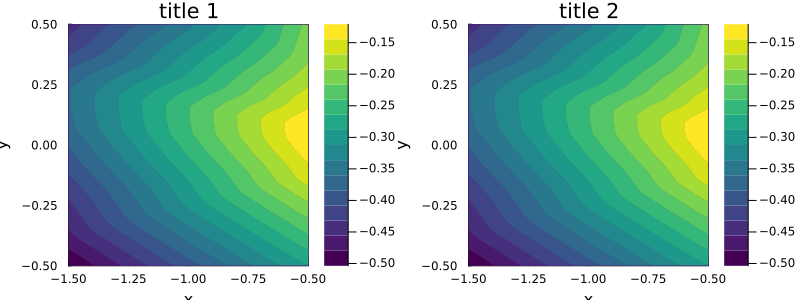

In [104]:
c_1 = contourf(x_range, y_range, xlabel="x", ylabel="y", title="title 1", (x, y) -> NN_comp(hcat(x, y)')[], c=cgrad(:viridis), lw=0)
c_2 = contourf(x_range, y_range, xlabel="x", ylabel="y", title="title 2", (x, y) -> forward_pass!(jump_model, [x, y])[], c=cgrad(:viridis), lw=0)
plot(c_1, c_2, layout=(1, 2), size=(800, 300))

## Fast/heuristic bound tightening

To use fast/heuristic bound tightening, user needs to set `bound_tightening="fast"`

In [120]:
jump_model = Model(Gurobi.Optimizer);
set_silent(jump_model)
set_attribute(jump_model, "TimeLimit", 10)

@time loose_U, loose_L = NN_formulate!(jump_model, NN_model, init_U, init_L; bound_tightening="fast", silent=true);

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20
  0.004356 seconds (64.89 k allocations: 3.018 MiB)


Time performance of MIP formulation is significantly highier.

In [121]:
sample_input = [-0.75, 0]
println("Input data: ", sample_input, "\nFast/heuristic bound tightening output: ", forward_pass!(jump_model, sample_input))

Input data: [-0.75, 0.0]
Fast/heuristic bound tightening output: [-0.1905930732098145]


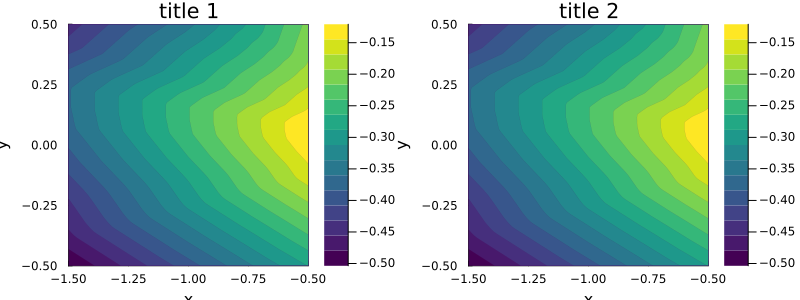

In [107]:
c_1 = contourf(x_range, y_range, xlabel="x", ylabel="y", title="title 1", (x, y) -> NN_model(hcat(x, y)')[], c=cgrad(:viridis), lw=0)
c_2 = contourf(x_range, y_range, xlabel="x", ylabel="y", title="title 2", (x, y) -> forward_pass!(jump_model, [x, y])[], c=cgrad(:viridis), lw=0)
plot(c_1, c_2, layout=(1, 2), size=(800, 300))

Now, lets compare the lower and upper bounds for standart and fast-tightened bounds:

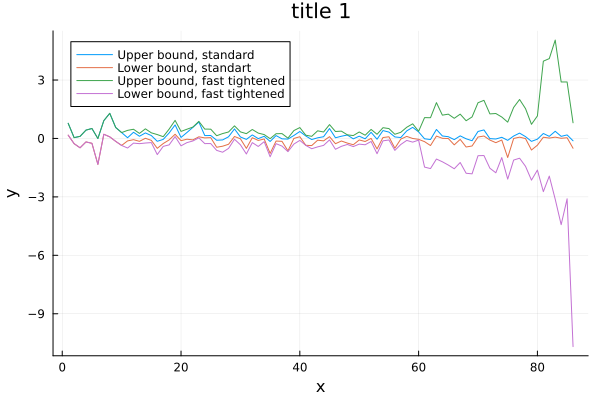

In [108]:
plot(collect(Iterators.flatten(bounds_U)), xlabel="x", ylabel="y", title="title 1",  label = "Upper bound, standard")
plot!(collect(Iterators.flatten(bounds_L)), label = "Lower bound, standart")
plot!(collect(Iterators.flatten(loose_U)), xlabel="x", ylabel="y",label = "Upper bound, fast tightened")
plot!(collect(Iterators.flatten(loose_L)), xlabel="x", ylabel="y", label = "Lower bound, fast tightened")

***NOTE: Here we need to add some meaningful comment***

## Output bounds

User can also set `bound_tightening="output"`, if he knows in advance how output variable is bounded.

He/she needs to manually specify the bounds for the output, by setting `U_out=upper_limit`, `L_out=lower_limit` (the two are vectors that restrict each output variable, e.g. in our case the output is 1d, so `U_out=[0.5]`, `L_out=[-0.75]`). 

In [109]:
# Formulate with output bounds considered
jump_model = Model(Gurobi.Optimizer);
set_silent(jump_model)
@time out_U, out_L = NN_formulate!(jump_model, NN_model, init_U, init_L; bound_tightening="output", U_out=[0.5], L_out=[-0.75], silent=true);

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20
 11.125267 seconds (232.46 k allocations: 9.359 MiB)


In [110]:
sample_input = [-0.75, 0]
println("Input data: ", sample_input, "\nOutput bound output: ", forward_pass!(jump_model, sample_input))

Input data: [-0.75, 0.0]
Output bound output: [-0.19059307320997296]


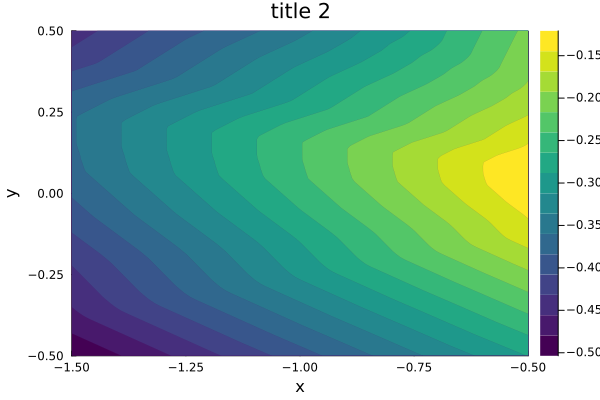

In [111]:
# Plot output bound model
contourf(x_range, y_range, (x, y) -> forward_pass!(jump_model, [x, y])[], c=cgrad(:viridis), lw=0, xlabel="x", ylabel="y", title="title 2")

## Precomputed bounds

Suppose user knows what are lower and upper bounds of each variable (output of each neuron), then he/she can use precomputed bounds. At first, he/she can compress the NN model

In [112]:
# Compress with precomputed bounds
NN_precomp, removed_precomp = NN_compress(NN_model, init_U, init_L, bounds_U, bounds_L);

Removed 2/10 neurons
Removed 17/50 neurons
Removed 10/20 neurons
Fully stable layer
Removed 5/5 neurons


In [113]:
NN_precomp

Chain(
  Dense(2 => 8, relu),                  # 24 parameters
  Dense(8 => 33, relu),                 # 297 parameters
  Dense(33 => 10, relu),                # 340 parameters
  Dense(10 => 1),                       # 11 parameters
)                   # Total: 8 arrays, 672 parameters, 3.125 KiB.

Then set `bound_tightening="precomputed"` and upper, lower bounds (`U_bounds`, `L_bounds`)

In [114]:
# Formulate with precomputed bounds
jump_model = Model(Gurobi.Optimizer);
set_silent(jump_model)
@time NN_formulate!(jump_model, NN_model, init_U, init_L; bound_tightening="precomputed", U_bounds=bounds_U, L_bounds=bounds_L);

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20
  0.008487 seconds (23.88 k allocations: 1.945 MiB, 76.43% gc time)


In [115]:
sample_input = [-0.75, 0]
println("Input data: ", sample_input, "\nPrecomputed bounds output: ", forward_pass!(jump_model, sample_input))

Input data: [-0.75, 0.0]
Precomputed bounds output: [-0.19059307321001367]


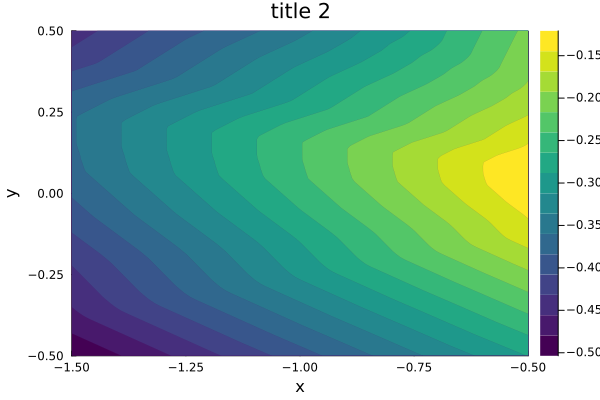

In [116]:
# Plot output bound model
contourf(x_range, y_range, (x, y) -> forward_pass!(jump_model, [x, y])[], c=cgrad(:viridis), lw=0, xlabel="x", ylabel="y", title="title 2")

## Finding optimum of the neural network

With any formulation finding the optimum of the neural network is very straightforward. Suppose, we are interested in maximizing the output neuron.

In [131]:
jump_model = Model(Gurobi.Optimizer)
set_silent(jump_model) # set desired parameters

bounds_U, bounds_L = NN_formulate!(jump_model, NN_model, init_U, init_L; bound_tightening="standard", compress=true)

last_layer, _ = maximum(keys(jump_model[:x].data))

@objective(jump_model, Max, jump_model[:x][last_layer, 1]) # maximize the output neuron
optimize!(jump_model)

println("The model found next solution:\n", value.(jump_model[:x][0, :]))
println("With objective function: ", objective_value(jump_model) )

Set parameter Username
Academic license - for non-commercial use only - expires 2025-05-20
The model found next solution:
  [1]  =  -0.5
  [2]  =  0.0764452
With objective function: -0.12074530320233469
